<p style="background-color:#FDFEFE; font-family:arial; color:#09042b; font-size:350%; text-align:center; border-radius:10px 10px;"></p>

<p style="background-color:#FDFEFE; font-family:arial; color:#09042b; font-size:400%; text-align:center; border-radius:10px 10px;"> Credit Score Classification</p>

<p style="background-color:#FDFEFE; font-family:arial; color:#09042b; font-size:350%; text-align:center; border-radius:10px 10px;"> ML and ANN Project </p>


<img src="https://media.istockphoto.com/photos/credit-score-concept-picture-id1333701057?k=20&m=1333701057&s=170667a&w=0&h=wPQona6Oa_kwNj-NWz73qeHA0JErXzIyfy_z05Ze7yE=" align="center"/>

<a id="toc"></a>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Content</p>

* [Aim of the Project](#0)
* [About Dataset](#1)
* [Importing Related Libraries](#2)
* [Recognizing & Understanding Data](#3)
* [Data Preprocessing](#4)    
* [Determining ML Model with Lazypredict](#5)
* [Implement Machine Learning Models](#6)
* [Implement ANN Models](#7)
* [Comparing the Performances of the Models](#8)
* [Feature Importance](#9)
* [Building Final Model](#10)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Aim of the Project</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>


A credit score is a number or a class that depicts a consumer’s creditworthiness. The higher the score, the better a borrower looks to potential lenders.

A credit score is based on credit history: number of open accounts, total levels of debt, repayment history, and other factors. Lenders use credit scores to evaluate the probability that an individual will repay loans in a timely manner.


## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">About Dataset</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

**Age :** the age of the person

**Occupation :** the occupation of the person

**Annual_Income :** the annual income of the person

**Num_Bank_Accounts :** the number of bank accounts a person holds

**Num_Credit_Card :** the number of other credit cards held by a person

**Interest_Rate :** the interest rate on credit card

**Num_of_Loan :** the number of loans taken from the bank

**Delay_from_due_date :** the average number of days delayed from the payment date

**Num_of_Delayed_Payment :** the average number of payments delayed by a person

**Changed_Credit_Limit :** the percentage change in credit card limit

**Num_Credit_Inquiries :** the number of credit card inquiries

**Outstanding_Debt :** the remaining debt to be paid (in USD)

**Credit_Utilization_Ratio :** the utilization ratio of credit card

**Credit_History_Age :** the age of credit history of the person

**Payment_of_Min_Amount :** whether only the minimum amount was paid by the person

**Total_EMI_per_month :** the monthly EMI payments (in USD)

**Amount_invested_monthly :** the monthly amount invested by the customer (in USD)

**Monthly_Balance :** the monthly balance amount of the customer (in USD)

**Credit_Score :** the bracket of credit score (Poor, Standard, Good)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Importing Related Libraries</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

In [1]:
# libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

#Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
import plotly.io as pio
pio.renderers.default = "notebook"

#To display the plots
# %matplotlib inline

# sklearn library for machine learning algorithms, data preprocessing, and evaluation
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix, log_loss, recall_score, accuracy_score, precision_score, f1_score, plot_confusion_matrix, roc_auc_score
from sklearn.metrics import make_scorer, average_precision_score

# yellowbrick library for visualizing the model performance
from yellowbrick.classifier import ConfusionMatrix

from sklearn.pipeline import Pipeline

# to get rid of the warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)
sns.set_style("whitegrid", {'axes.grid' : False})

# To display maximum columns
pd.set_option('display.max_columns', None)

# To display maximum rows
pd.set_option('display.max_rows', 200)

pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [2]:
pip install scikit-learn-intelex  # to accelerate the CPU

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#'


## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Recognizing and Understanding Data</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

In [5]:
train = pd.read_csv("credit_score_without_dummy.csv")

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98288 entries, 0 to 98287
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       98288 non-null  int64  
 1   Occupation                98288 non-null  object 
 2   Annual_Income             98288 non-null  float64
 3   Num_Bank_Accounts         98288 non-null  float64
 4   Num_Credit_Card           98288 non-null  float64
 5   Interest_Rate             98288 non-null  float64
 6   Num_of_Loan               98288 non-null  float64
 7   Delay_from_due_date       98288 non-null  int64  
 8   Num_of_Delayed_Payment    98288 non-null  float64
 9   Changed_Credit_Limit      98288 non-null  float64
 10  Num_Credit_Inquiries      98288 non-null  float64
 11  Outstanding_Debt          98288 non-null  float64
 12  Credit_Utilization_Ratio  98288 non-null  float64
 13  Credit_History_Age        98288 non-null  int64  
 14  Paymen

In [7]:
# test = pd.read_csv("test_without_dummy.csv")

In [8]:
# test.info()

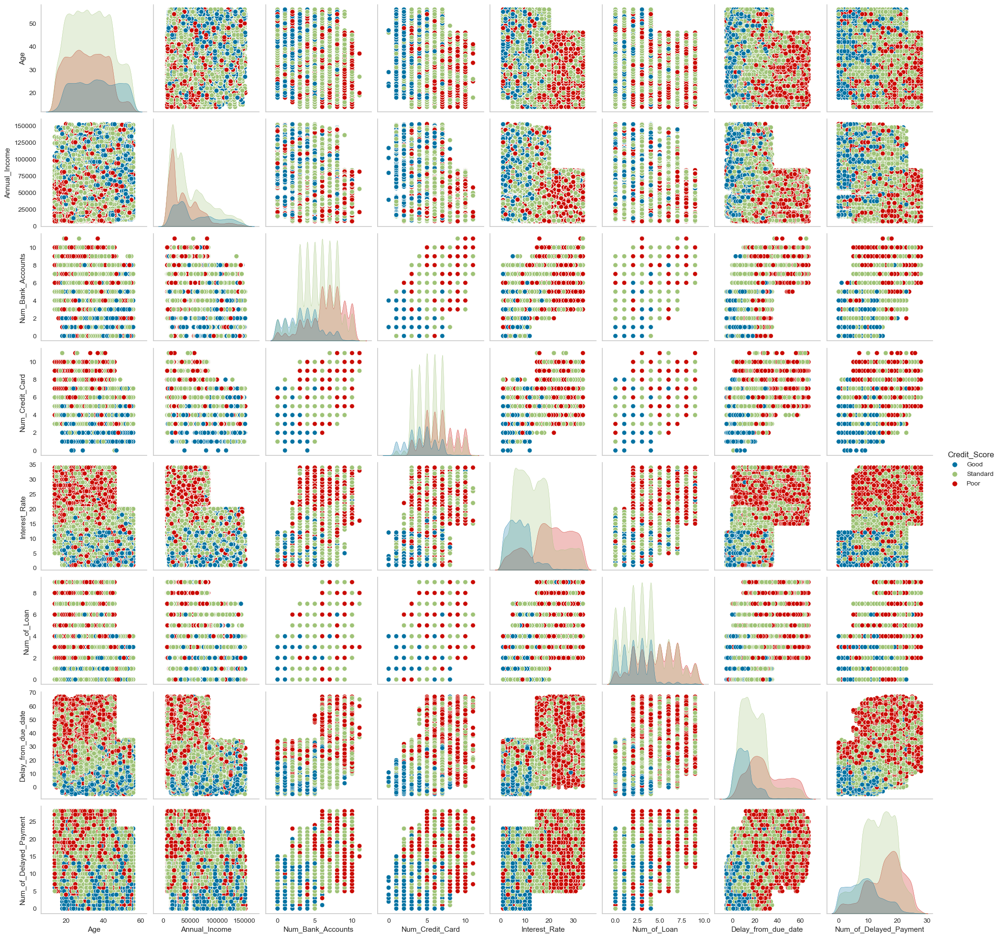

In [57]:
train1 = train[['Age', 'Occupation', 'Annual_Income', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Credit_Score']]
sns.pairplot(train1, hue="Credit_Score")
plt.show()

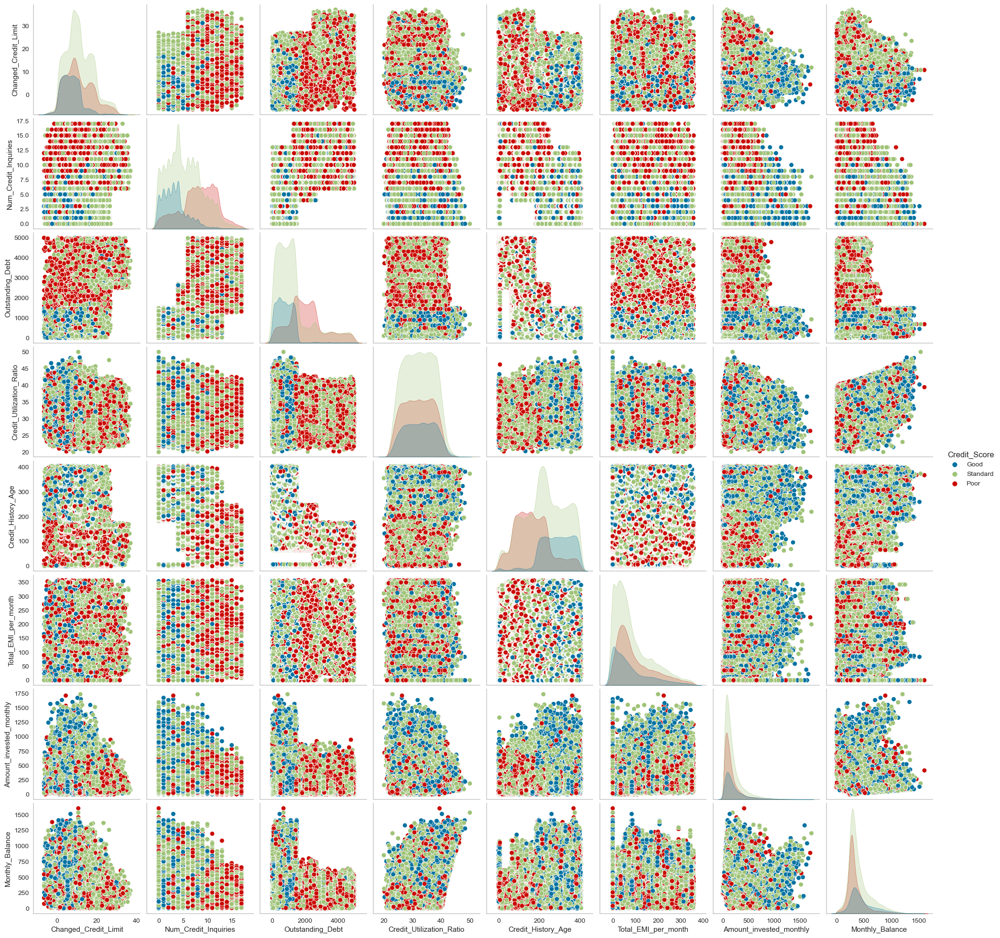

In [58]:
train2 = train[['Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Monthly_Balance', 'Credit_Score']]
sns.pairplot(train2, hue="Credit_Score")
plt.show()

In [7]:
train.Credit_Score.value_counts()

Standard    52509
Poor        28723
Good        17056
Name: Credit_Score, dtype: int64

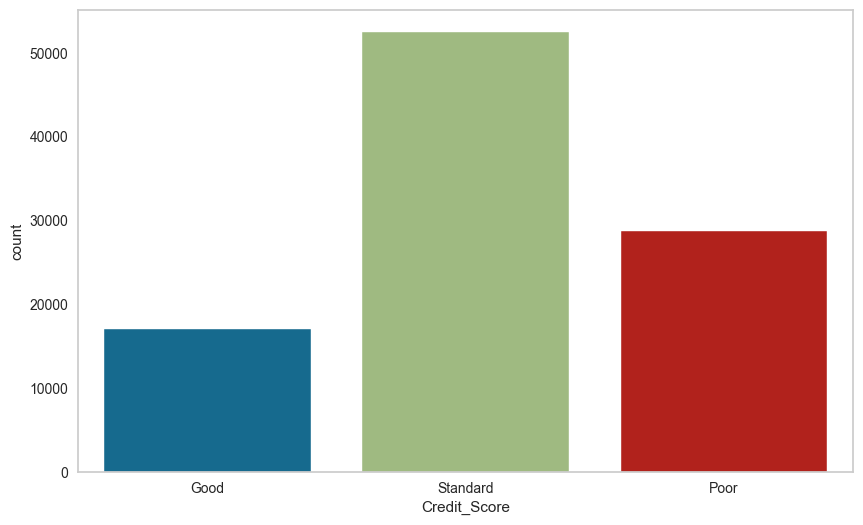

In [8]:
sns.countplot(train["Credit_Score"])
plt.show()

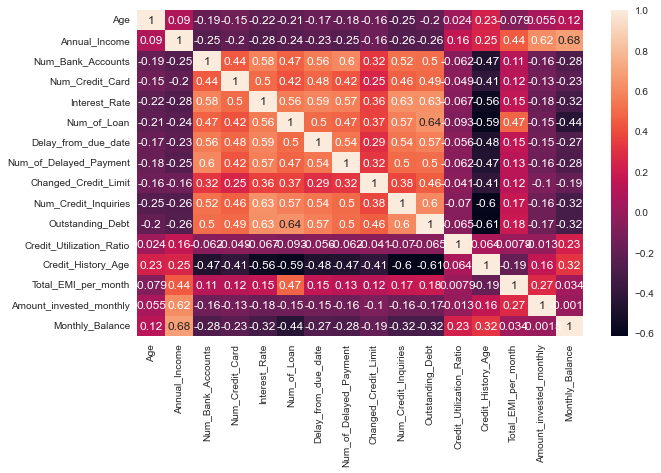

In [12]:
sns.heatmap(train.corr(),annot=True)
plt.show()

In [9]:
train.head()

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,23,Scientist,19114.12,3.00,4.00,3.00,4.00,3,7.00,11.27,4.00,809.98,26.82,265,No,49.57,80.42,312.49,Good
1,23,Scientist,19114.12,3.00,4.00,3.00,4.00,-1,4.00,11.27,4.00,809.98,31.94,266,No,49.57,118.28,284.63,Good
2,23,Scientist,19114.12,3.00,4.00,3.00,4.00,3,7.00,11.27,4.00,809.98,28.61,267,No,49.57,81.70,331.21,Good
3,23,Scientist,19114.12,3.00,4.00,3.00,4.00,5,4.00,6.27,4.00,809.98,31.38,268,No,49.57,199.46,223.45,Good
4,23,Scientist,19114.12,3.00,4.00,3.00,4.00,6,4.00,11.27,4.00,809.98,24.80,269,No,49.57,41.42,341.49,Good


## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Data Preprocessing</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

In [10]:
X = train.drop("Credit_Score",axis=1)
y = train.Credit_Score

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101, stratify = y)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Determining ML Model with Lazypredict</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

https://towardsdatascience.com/lazy-predict-fit-and-evaluate-all-the-models-from-scikit-learn-with-a-single-line-of-code-7fe510c7281

Lazypredict library automatically applies preprocessing to the dataset. First, it imputes missing values using SimpleImputer (using the mean for numeric features and a constant ‘missing’ value for categorical ones). Then, it uses StandardScaler for numeric features and either OneHotEncoder or OrdinalEncoder for the categorical features (depending on the cardinality — number of unique values).

In [65]:
import pyforest

In [66]:
import lazypredict
from lazypredict.Supervised import LazyClassifier

In [67]:
clf = LazyClassifier(verbose=0,ignore_warnings=True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [12:30<00:00, 25.89s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreesClassifier,0.81,0.81,None,0.81,8.86
RandomForestClassifier,0.81,0.80,None,0.81,18.95
BaggingClassifier,0.80,0.80,None,0.80,8.45
KNeighborsClassifier,0.77,0.76,None,0.77,27.45
DecisionTreeClassifier,0.74,0.73,None,0.74,1.28
ExtraTreeClassifier,0.74,0.72,None,0.74,0.35
LGBMClassifier,0.73,0.70,None,0.73,3.84
GaussianNB,0.59,0.67,None,0.58,0.32
BernoulliNB,0.59,0.67,None,0.59,0.43


In [12]:
# grab categorical columns' names for further analysis

cat = X.select_dtypes("object").columns
cat

Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object')

In [13]:
# define column transformer object to apply onehotencoding and scaling on data

from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler

column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat), 
                                       remainder=MinMaxScaler())  # apply onehot encoding on categorical features, then apply minmax scaler on remaining features

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Implement Machine Leraning Models</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a> 

In [14]:
# define a function to compare evaluation metrics of models

def eval_metric(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    print("TEST REPORT")
    print(classification_report(y_test, y_pred_test))
    plot_confusion_matrix(model, X_test, y_test);

    print("\n"*3, "-*"*30)
    print("TRAIN REPORT")
    print(classification_report(y_train, y_pred_train))
    plot_confusion_matrix(model, X_train, y_train)
    plt.show()

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Logistic Model</p>

In [15]:
# built a pipe model for Logistic Regression

operations = [("OneHotEncoder", column_trans), ("log_model", LogisticRegression(class_weight='balanced',max_iter=10000,
                                                                          random_state=42))]

log_pipe_model = Pipeline(steps=operations)

In [16]:
# fit the logistic regression model on train data

log_pipe_model.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                ('log_model',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    random_state=42))])

TEST REPORT
              precision    recall  f1-score   support

        Good       0.41      0.82      0.55      3411
        Poor       0.62      0.69      0.65      5745
    Standard       0.79      0.49      0.60     10502

    accuracy                           0.60     19658
   macro avg       0.61      0.67      0.60     19658
weighted avg       0.67      0.60      0.61     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.42      0.83      0.55     13645
        Poor       0.62      0.69      0.65     22978
    Standard       0.79      0.49      0.60     42007

    accuracy                           0.61     78630
   macro avg       0.61      0.67      0.60     78630
weighted avg       0.68      0.61      0.61     78630



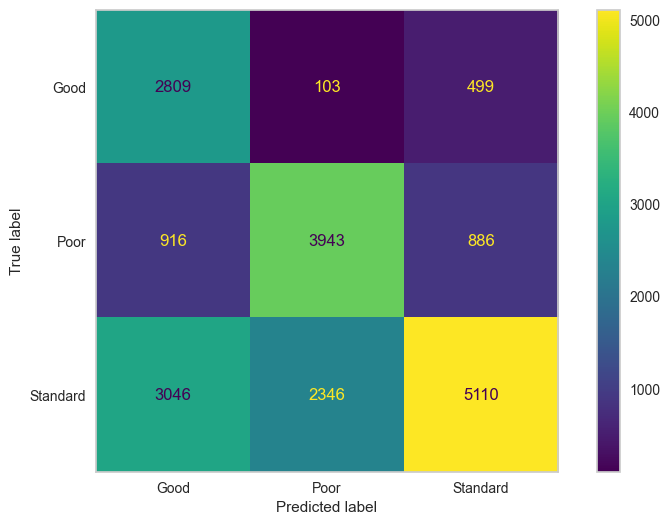

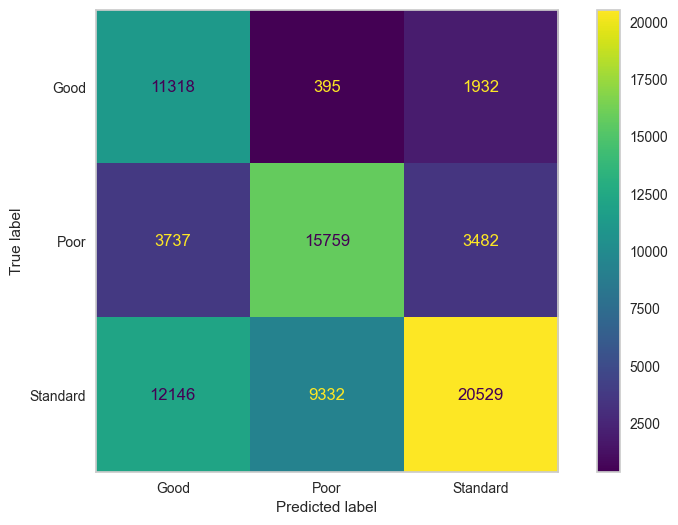

In [17]:
# check the evaluation metrics of logistic model

eval_metric(log_pipe_model, X_train, y_train, X_test, y_test)

 ## Define Scoring to determine Poor Credit Score correctly

In [18]:
scoring = {"f1_Poor" : make_scorer(f1_score, average = None, labels =["Poor"]),
           "precision_Poor" : make_scorer(precision_score, average = None, labels =["Poor"]),
           "recall_Poor" : make_scorer(recall_score, average = None, labels =["Poor"])}

### Logistic Model Cross Validation

In [19]:
model = Pipeline(operations)
scores = cross_validate(model, X_train, y_train, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_f1_Poor          0.65
test_precision_Poor   0.62
test_recall_Poor      0.68
dtype: float64

###  Logistic Model GridsearchCV

In [20]:
# Defining gridsearch scoring parameter to maximize recall values of Poor Credit Score

recall_Poor =  make_scorer(recall_score, average=None, labels=["Poor"])

In [21]:
# reset the pipe model
model = Pipeline(operations)

# defining the grid parameter
penalty = ["l1", "l2"]
C = np.logspace(-1, 2, 4)
solver = ['liblinear', 'lbfgs']

param_grid = {"log_model__penalty" : penalty,
             "log_model__C" : C,
             "log_model__solver" : solver}

# built Logistic grid model
log_grid_model = GridSearchCV(model, param_grid = param_grid, scoring=recall_Poor, cv=5, n_jobs=-1)

In [78]:
# fit grid model on train data

log_grid_model.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                                       ('log_model',
                                        LogisticRegression(class_weight='balanced',
                                                           max_iter=10000,
                                                           random_state=42))]),
             n_jobs=-1,
             param_grid={'log_model__C': array([  0.1,   1. ,  10. , 100. ]),
 

In [79]:
log_grid_model.best_estimator_

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                ('log_model',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    max_iter=10000, random_state=42))])

In [80]:
log_grid_model.best_params_

{'log_model__C': 0.1, 'log_model__penalty': 'l2', 'log_model__solver': 'lbfgs'}

In [81]:
log_grid_model.best_score_

0.6863088781369238

TEST REPORT
              precision    recall  f1-score   support

        Good       0.41      0.83      0.55      3411
        Poor       0.62      0.69      0.65      5745
    Standard       0.79      0.48      0.60     10502

    accuracy                           0.60     19658
   macro avg       0.61      0.67      0.60     19658
weighted avg       0.67      0.60      0.61     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.41      0.83      0.55     13645
        Poor       0.62      0.69      0.65     22978
    Standard       0.79      0.49      0.60     42007

    accuracy                           0.60     78630
   macro avg       0.61      0.67      0.60     78630
weighted avg       0.68      0.60      0.61     78630



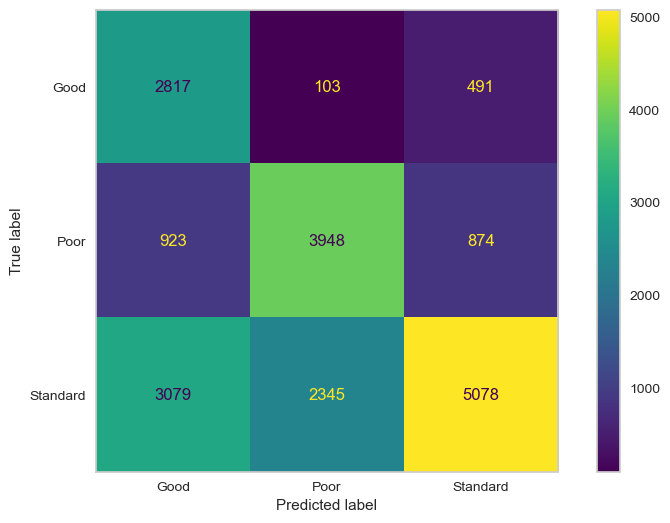

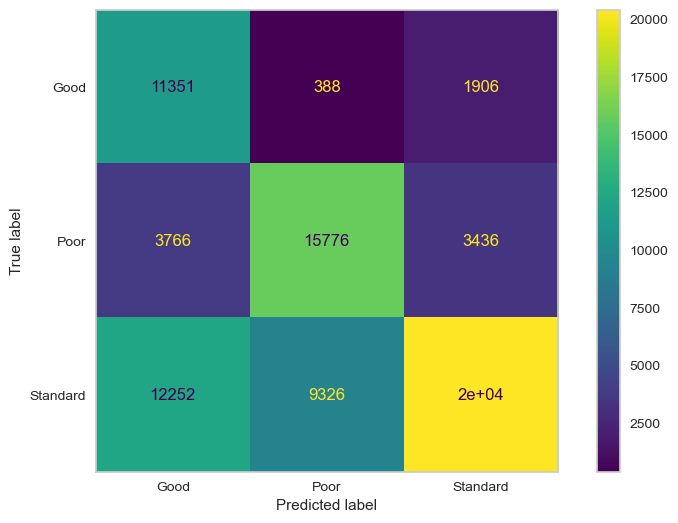

In [82]:
# checking the evaluation metrics of grid model

eval_metric(log_grid_model, X_train, y_train, X_test, y_test)

### Evaluating Precision-Recall Curves

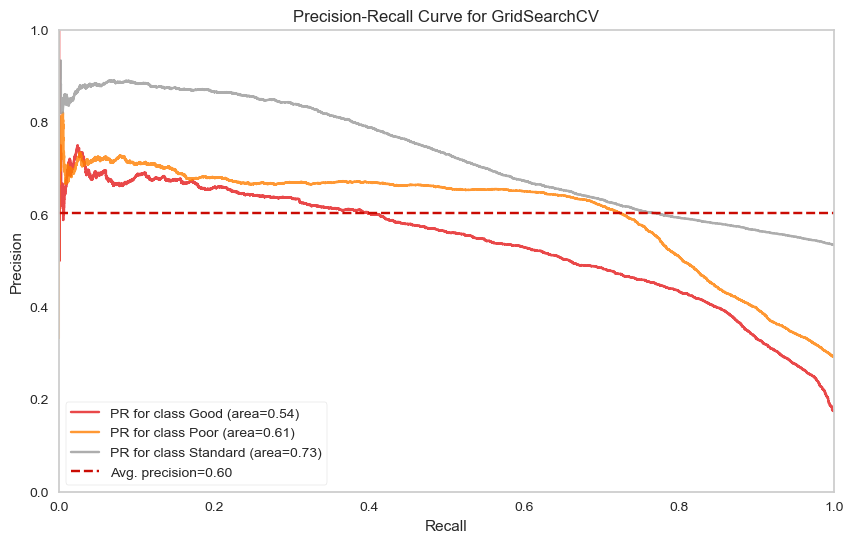

In [84]:
# precision-recall curve for Logistic grid model

from yellowbrick.classifier import PrecisionRecallCurve

model = log_grid_model

viz = PrecisionRecallCurve(
    model,
    per_class=True,
    classes=["Good", "Poor", "Standard"],
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

In [ ]:
Cuma St: 14.00'te kalan modellerimize bakacağız.

* KNN : F1266-Mehmet +

* Random Forest ve Extra Trees : İlhan +
* XGBoost : Ahmet 
* Bagging DT : İlker +

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Ada Boost Model</p>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">SVC Model</p>

In [29]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [30]:
operations_svc = [("OneHotEncoder", column_trans), ("svc", SVC(class_weight="balanced",random_state=42))]
pipe_model = Pipeline(steps=operations_svc)

In [ ]:
pipe_model.fit(X_train, y_train)
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

In [ ]:
model = Pipeline(steps=operations_svc)
scores = cross_validate(model, X_train, y_train, scoring = scoring, cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
operations_svc = [("OneHotEncoder", column_trans), ("svc", SVC(class_weight="balanced",random_state=42))]
model = Pipeline(steps=operations_svc)
svm_model_grid = GridSearchCV(model,
                              param_grid,
                              verbose=3,
                              scoring=recall_Poor,
                              n_jobs=-1)

In [ ]:
svm_model_grid.fit(X_train, y_train)

In [ ]:
svm_model_grid.best_params_

In [ ]:
svm_model_grid.best_index_

In [ ]:
svm_model_grid.best_score_

In [ ]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">XGBoost Model</p>

In [19]:
train = pd.read_csv("credit_score_without_dummy.csv")

In [20]:
X = train.drop("Credit_Score",axis=1)
y = train.Credit_Score

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101, stratify = y)

In [22]:
cat = X.select_dtypes("object").columns
cat

Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object')

In [23]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler

column_trans = make_column_transformer((OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value = -1), cat), 
                                       remainder="passthrough") 

In [24]:
import xgboost as xgb

xgb.__version__ #Should be 0.9

'0.90'

In [25]:
from xgboost import XGBClassifier

operations = [("OrdinalEncoder" , column_trans), ("XGB_model", XGBClassifier(random_state = 101))]

pipe_model = Pipeline(steps = operations)

pipe_model.fit(X_train, y_train)

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                ('XGB_model',
                 XGBClassifier(objective='multi:softprob', random_state=101))])

TEST REPORT
              precision    recall  f1-score   support

        Good       0.60      0.52      0.55      3411
        Poor       0.74      0.63      0.68      5745
    Standard       0.70      0.79      0.74     10502

    accuracy                           0.70     19658
   macro avg       0.68      0.64      0.66     19658
weighted avg       0.69      0.70      0.69     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.60      0.52      0.56     13645
        Poor       0.75      0.64      0.69     22978
    Standard       0.71      0.80      0.75     42007

    accuracy                           0.70     78630
   macro avg       0.68      0.65      0.66     78630
weighted avg       0.70      0.70      0.70     78630



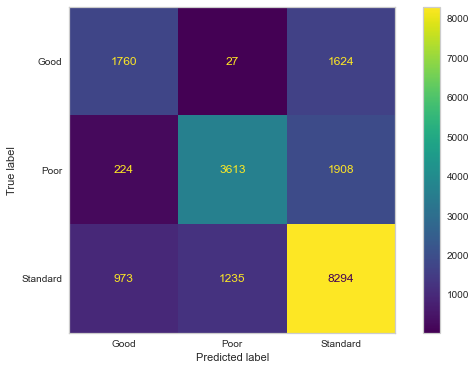

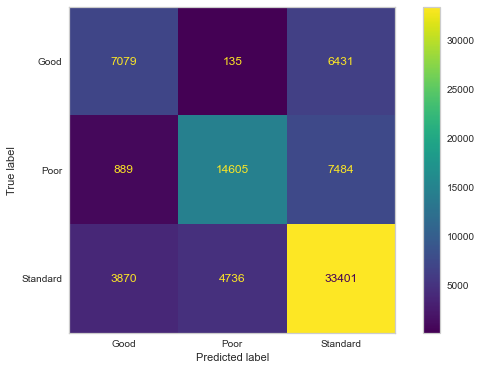

In [26]:
eval_metric(pipe_model, X_train, y_train, X_test, y_test)

### XGBoost Cross Validation

In [ ]:
scores = cross_validate(pipe_model, X_train, y_train, scoring= scoring, cv = 10)
df_scores =    pd.DataFrame.from_records(scores)
#Altenatively, pd.DataFrame(scores, index = range(1, 11)) for cv=10
df_scores.mean()[2:]

### Feature Importance

In [27]:
pipe_model["XGB_model"].feature_importances_

array([0.00463734, 0.5171023 , 0.00478179, 0.00662429, 0.03213051,
       0.05142017, 0.08670051, 0.00996121, 0.03023381, 0.02700701,
       0.02716508, 0.02188271, 0.15408127, 0.00123837, 0.00883306,
       0.00542066, 0.00788458, 0.00289526], dtype=float32)

In [28]:
pipe_model["XGB_model"].feature_importances_.sum() #The sum should be 1.

0.99999994

In [29]:
X_train.head(1)

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
78626,51,Writer,93589.48,6.00,7.00,16.00,3.00,24,17.00,9.92,1.00,425.51,33.92,367,No,200.71,447.45,340.36


In [30]:
pd.DataFrame(pipe_model["OrdinalEncoder"].fit_transform(X_train))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,14.00,0.00,51.00,93589.48,6.00,7.00,16.00,3.00,24.00,17.00,9.92,1.00,425.51,33.92,367.00,200.71,447.45,340.36
1,10.00,1.00,26.00,75612.08,8.00,7.00,17.00,5.00,52.00,18.00,8.50,10.00,2312.82,30.01,214.00,226.10,73.48,580.52
2,4.00,1.00,54.00,114588.40,5.00,7.00,20.00,0.00,21.00,17.00,14.21,5.00,941.85,34.30,397.00,0.00,1008.21,215.59
3,1.00,1.00,46.00,62799.48,9.00,8.00,32.00,9.00,54.00,18.00,20.07,9.00,4144.96,41.90,38.00,271.36,287.86,433.53
4,13.00,0.00,41.00,20540.49,0.00,4.00,8.00,1.00,3.00,3.00,5.09,2.00,1118.37,32.40,194.00,8.82,37.58,389.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78625,14.00,0.00,33.00,100716.36,8.00,4.00,17.00,0.00,7.00,8.00,5.69,6.00,605.24,29.14,197.00,0.00,365.65,755.66
78626,5.00,0.00,37.00,20426.38,1.00,7.00,11.00,4.00,3.00,4.00,3.45,1.00,622.66,30.20,385.00,44.64,35.93,344.75
78627,12.00,0.00,28.00,95295.57,6.00,6.00,3.00,0.00,11.00,20.00,11.14,1.00,406.93,28.42,293.00,0.00,291.20,753.13
78628,0.00,0.00,48.00,42940.26,3.00,7.00,2.00,1.00,12.00,10.00,6.84,3.00,90.74,38.20,221.00,34.68,292.29,345.86


In [31]:
features = list(X_train.select_dtypes("object").columns) + list(X_train.select_dtypes("number").columns)
features

['Occupation',
 'Payment_of_Min_Amount',
 'Age',
 'Annual_Income',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Credit_History_Age',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

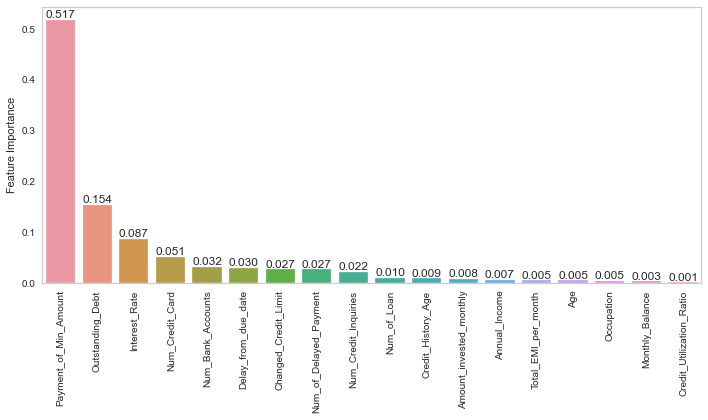

In [32]:
df_f_i = pd.DataFrame(data = pipe_model["XGB_model"].feature_importances_, index=features, #index=X.columns
                      columns = ["Feature Importance"]).sort_values("Feature Importance", ascending=False)




ax = sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
ax.bar_label(ax.containers[0],fmt="%.3f");
plt.xticks(rotation = 90)
plt.tight_layout()

In [33]:
X_train.head()

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
78626,51,Writer,93589.48,6.00,7.00,16.00,3.00,24,17.00,9.92,1.00,425.51,33.92,367,No,200.71,447.45,340.36
96415,26,Media_Manager,75612.08,8.00,7.00,17.00,5.00,52,18.00,8.50,10.00,2312.82,30.01,214,Yes,226.10,73.48,580.52
17467,54,Engineer,114588.40,5.00,7.00,20.00,0.00,21,17.00,14.21,5.00,941.85,34.30,397,Yes,0.00,1008.21,215.59
52110,46,Architect,62799.48,9.00,8.00,32.00,9.00,54,18.00,20.07,9.00,4144.96,41.90,38,Yes,271.36,287.86,433.53
1807,41,Teacher,20540.49,0.00,4.00,8.00,1.00,3,3.00,5.09,2.00,1118.37,32.40,194,No,8.82,37.58,389.57


In [34]:
X_test.head()

,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
91335,16,Lawyer,63928.95,6.00,6.00,8.00,4.00,7,17.00,7.46,10.00,1290.64,24.49,232,Yes,184.03,90.68,471.53
58081,24,Doctor,17366.08,6.00,6.00,14.00,1.00,28,12.00,15.53,4.00,133.38,33.89,226,Yes,12.97,114.82,298.72
65111,32,Journalist,85084.80,4.00,3.00,12.00,1.00,11,6.00,12.49,1.00,100.42,35.75,256,Yes,69.20,186.47,694.07
94537,17,Musician,59930.64,6.00,7.00,33.00,4.00,62,19.00,7.43,9.00,2418.61,39.74,114,Yes,194.14,215.39,302.97
15725,41,Accountant,51884.96,6.00,4.00,10.00,0.00,17,18.00,11.98,10.00,811.42,40.29,201,Yes,0.00,186.87,512.21


### Dropping the most important feature to see whether there is a significant change on the scores or not.

In [35]:
X2 = X.drop(columns = ["Payment_of_Min_Amount"])

In [36]:
cat2 = X2.select_dtypes("object").columns
cat2

Index(['Occupation'], dtype='object')

In [37]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.2, random_state=101)

In [38]:
column_trans2 = make_column_transformer((OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value = -1), cat2), 
                                       remainder="passthrough") 

In [39]:
operations2 = [("OrdinalEncoder" , column_trans2), ("XGB_model2", XGBClassifier(random_state = 101))]

pipe_model2 = Pipeline(steps = operations2)

pipe_model2.fit(X_train2, y_train2)

Pipeline(steps=[('OrdinalEncoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ordinalencoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index(['Occupation'], dtype='object'))])),
                ('XGB_model2',
                 XGBClassifier(objective='multi:softprob', random_state=101))])

TEST REPORT
              precision    recall  f1-score   support

        Good       0.60      0.49      0.54      3419
        Poor       0.75      0.63      0.68      5729
    Standard       0.70      0.80      0.75     10510

    accuracy                           0.70     19658
   macro avg       0.68      0.64      0.66     19658
weighted avg       0.70      0.70      0.69     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.61      0.49      0.54     13637
        Poor       0.75      0.63      0.69     22994
    Standard       0.70      0.80      0.75     41999

    accuracy                           0.70     78630
   macro avg       0.69      0.64      0.66     78630
weighted avg       0.70      0.70      0.70     78630



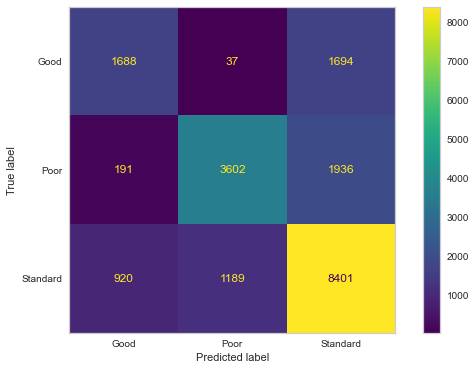

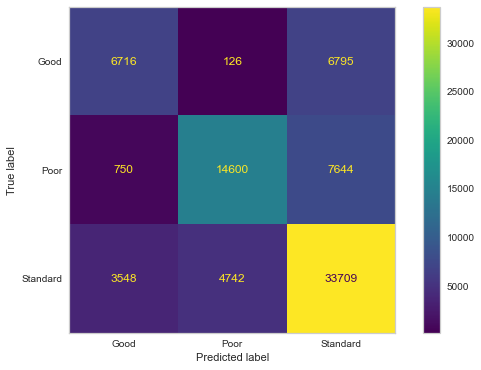

In [40]:
eval_metric(pipe_model2, X_train2, y_train2, X_test2, y_test2)

In [ ]:
model = Pipeline(operations2)
scores = cross_validate(model, X_train2, y_train2, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

#The scores are almost identical, so keep the feature.

### Grid Search 

In [42]:
operations = [("OrdinalEncoder" , column_trans), ("XGB_model", XGBClassifier(random_state = 101))]

pipe_model = Pipeline(steps = operations)

In [43]:
param_grid = {"XGB_model__n_estimators":[50, 100, 200], 'XGB_model__max_depth':[3,4,5], "XGB_model__learning_rate": [0.1, 0.2],
             "XGB_model__subsample":[0.5, 0.8, 1], "XGB_model__colsample_bytree":[0.5,0.7, 1]}

In [44]:
recall_Poor = make_scorer(recall_score, average = None , labels =["Poor"])

In [45]:
xgb_grid = GridSearchCV(pipe_model, param_grid = param_grid, scoring=recall_Poor, cv=5, n_jobs=-1 , verbose = 2)

In [ ]:
xgb_grid.fit(X_train, y_train)

In [ ]:
xgb_grid.best_estimator_

In [ ]:
xgb_grid.best_params_

In [ ]:
xgb_grid.best_score_

In [ ]:
eval_metric(xgb_grid_model, X_train, y_train, X_test, y_test)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Decision Tree Model</p>

In [ ]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OrdinalEncoder 

In [ ]:
cat = X.select_dtypes("object").columns
cat

In [ ]:
#cat = X.select_dtypes("object").columns.columns.to_list() 
#cat

In [ ]:
column_trans = make_column_transformer(
    (OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cat), 
    remainder='passthrough'
) 

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline

In [ ]:
dt_model = DecisionTreeClassifier(random_state=101,class_weight='balanced')
operations = [("OrdinalEncoder", column_trans), ("dt", dt_model)]

pipe_dt = Pipeline(steps=operations)
pipe_dt.fit(X_train, y_train)

In [ ]:
eval_metric(pipe_dt, X_train, y_train, X_test, y_test)  

### dt cross validation

In [ ]:
model = Pipeline(operations)
scores = cross_validate(model, X_train, y_train, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

### feature importance

In [ ]:
pipe_dt["dt"].feature_importances_ 

In [ ]:
pipe_dt["dt"].feature_importances_.sum()  

In [ ]:
pd.DataFrame(pipe_dt["OrdinalEncoder"].fit_transform(X_train)).head(4)

In [ ]:
list(X_train.select_dtypes("object").columns)

In [ ]:
list(X_train.select_dtypes("number").columns)

In [ ]:
column_trans.get_feature_names_out() # feature names bu şekilde de alınabilir.

In [ ]:
features = list(X_train.select_dtypes("object").columns) + list(X_train.select_dtypes("number").columns)
features

In [ ]:
df_f_i = pd.DataFrame(data = pipe_dt["dt"].feature_importances_, index=features, #index=X.columns
                      columns = ["Feature Importance"]).sort_values("Feature Importance", ascending=False)




ax = sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
ax.bar_label(ax.containers[0],fmt="%.3f");
plt.xticks(rotation = 90)
plt.tight_layout()

In [ ]:
X2 = X.drop(columns = ["Outstanding_Debt"])

In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.2, random_state=101)

In [ ]:
operations2 = [("OrdinalEncoder", column_trans), ("DT_model", DecisionTreeClassifier(random_state=101))]

pipe_model2 = Pipeline(steps=operations2)

pipe_model2.fit(X_train2, y_train2)

In [ ]:
eval_metric(pipe_model2, X_train2, y_train2, X_test2, y_test2)

In [ ]:
model = Pipeline(operations)
scores = cross_validate(model, X_train2, y_train2, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

## DT Grid Search

In [ ]:
recall_Poor =  make_scorer(recall_score, average=None, labels=["Poor"])

In [ ]:
model = Pipeline(steps=operations)

                                    
param_grid = {
    "dt__class_weight" : ["balanced"], 
    "dt__criterion" : ["gini", "entropy"], 
    "dt__splitter": ["best", "random"],  
    "dt__max_features":["auto", "log2"], 
    "dt__max_depth": [None, 1, 2,3,4,5,6],
    "dt__min_samples_split": [2, 3],
    "dt__min_samples_leaf": [1, 2, 3],
}


dt_grid_model = GridSearchCV(model, param_grid = param_grid, scoring=recall_Poor, cv=5, n_jobs=-1, error_score="raise")

In [ ]:
%%time
dt_grid_model.fit(X_train, y_train)

In [ ]:
dt_grid_model.best_estimator_

In [ ]:
dt_grid_model.best_score_

In [ ]:
eval_metric(dt_grid_model, X_train, y_train, X_test, y_test)

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">KNN Model</p>

In [22]:
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier

You can find above Data Preprocessing codes: X = train.drop("Credit_Score",axis=1) y = train.Credit_Score X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101, stratify = y)

In [23]:
cat_columns = X.select_dtypes("object").columns
cat_columns

Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object')

In [24]:
train.Occupation.unique()

array(['Scientist', 'Teacher', 'Engineer', 'Entrepreneur', 'Developer',
       'Lawyer', 'Media_Manager', 'Doctor', 'Journalist', 'Manager',
       'Accountant', 'Musician', 'Mechanic', 'Writer', 'Architect'],
      dtype=object)

In [25]:
column_trans_2 = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat_columns), 
                                       remainder=MinMaxScaler())

In [26]:
operations_2 = [("OneHotEncoder", column_trans_2 ), ("knn", KNeighborsClassifier()),  ]
knn_pipe_model = Pipeline(steps=operations_2)

In [27]:
# fit the knn classification model on train data
knn_pipe_model.fit(X_train, y_train)

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                ('knn', KNeighborsClassifier())])

In [28]:
y_pred_2 = knn_pipe_model.predict(X_test)
y_pred_2

array(['Standard', 'Standard', 'Standard', ..., 'Good', 'Standard',
       'Poor'], dtype=object)

In [ ]:
#column_trans_2.transform(X_test)

### Model Performance

In [29]:
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

###### The function shown below is taken exactly from the above sections to compare evaluation metrics of models. 

          
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    print("TEST REPORT")
    print(classification_report(y_test, y_pred_test))
    plot_confusion_matrix(model, X_test, y_test);

    print("\n"*3, "-*"*30)
    print("TRAIN REPORT")
    print(classification_report(y_train, y_pred_train))
    plot_confusion_matrix(model, X_train, y_train)
    plt.show()

TEST REPORT
              precision    recall  f1-score   support

        Good       0.74      0.75      0.75      3411
        Poor       0.78      0.84      0.80      5745
    Standard       0.83      0.79      0.81     10502

    accuracy                           0.80     19658
   macro avg       0.78      0.79      0.79     19658
weighted avg       0.80      0.80      0.80     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.82      0.84      0.83     13645
        Poor       0.83      0.90      0.86     22978
    Standard       0.89      0.84      0.86     42007

    accuracy                           0.86     78630
   macro avg       0.85      0.86      0.85     78630
weighted avg       0.86      0.86      0.86     78630



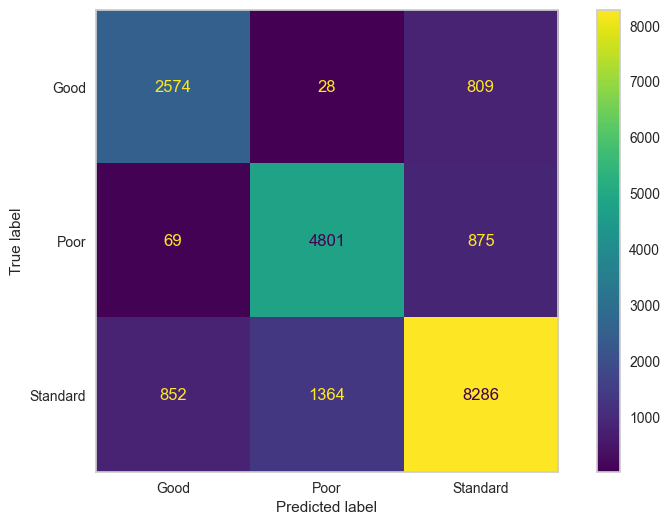

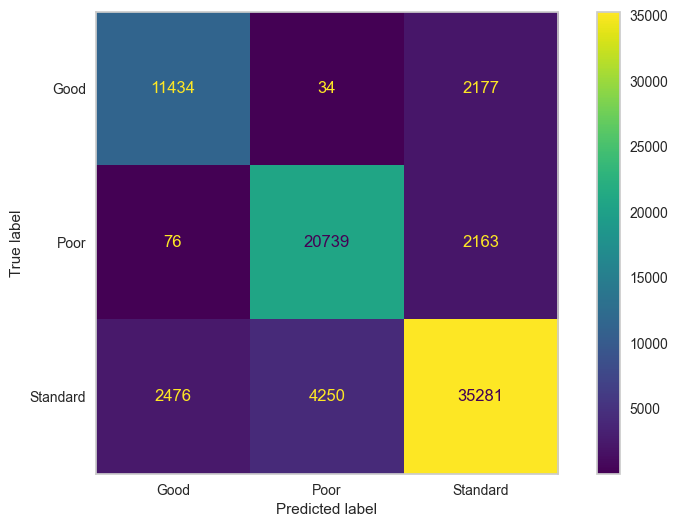

In [31]:
# Let's check the evaluation metrics of knn model

eval_metric(knn_pipe_model, X_train, y_train, X_test, y_test)

### Changing the parameters of the pipe_model

In [32]:
knn_pipe_model.get_params() 

{'memory': None,
 'steps': [('OneHotEncoder',
   ColumnTransformer(remainder=MinMaxScaler(),
                     transformers=[('onehotencoder',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse=False),
                                    Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
  ('knn', KNeighborsClassifier())],
 'verbose': False,
 'OneHotEncoder': ColumnTransformer(remainder=MinMaxScaler(),
                   transformers=[('onehotencoder',
                                  OneHotEncoder(handle_unknown='ignore',
                                                sparse=False),
                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))]),
 'knn': KNeighborsClassifier(),
 'OneHotEncoder__n_jobs': None,
 'OneHotEncoder__remainder__clip': False,
 'OneHotEncoder__remainder__copy': True,
 'OneHotEncoder__remainder__feature_range': (0, 1),
 'OneH

In [33]:
knn_pipe_model.set_params(knn__n_neighbors= 9) #changing the default neighbor parameter with 9.

Pipeline(steps=[('OneHotEncoder',
                 ColumnTransformer(remainder=MinMaxScaler(),
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                ('knn', KNeighborsClassifier(n_neighbors=9))])

In [34]:
knn_pipe_model.get_params() # we can see the changed neighbor parameter.

{'memory': None,
 'steps': [('OneHotEncoder',
   ColumnTransformer(remainder=MinMaxScaler(),
                     transformers=[('onehotencoder',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse=False),
                                    Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
  ('knn', KNeighborsClassifier(n_neighbors=9))],
 'verbose': False,
 'OneHotEncoder': ColumnTransformer(remainder=MinMaxScaler(),
                   transformers=[('onehotencoder',
                                  OneHotEncoder(handle_unknown='ignore',
                                                sparse=False),
                                  Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))]),
 'knn': KNeighborsClassifier(n_neighbors=9),
 'OneHotEncoder__n_jobs': None,
 'OneHotEncoder__remainder__clip': False,
 'OneHotEncoder__remainder__copy': True,
 'OneHotEncoder__remainder__feat

### Elbow Method for Choosing Reasonable K Values

In [37]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

In [38]:
X_train_scaled =  knn_pipe_model['OneHotEncoder'].fit_transform(X_train)
X_test_scaled =   knn_pipe_model['OneHotEncoder'].transform(X_test)

In [39]:
test_error_rates = [] # We performed this part through the recall parameter.

for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k) 
    knn_model.fit(X_train_scaled,y_train) 
   
    y_pred_test = knn_model.predict(X_test_scaled)  
      
    test_error = 1 - recall_score(y_test,y_pred_test,average=None ) 
    
    test_error_rates.append(test_error) 

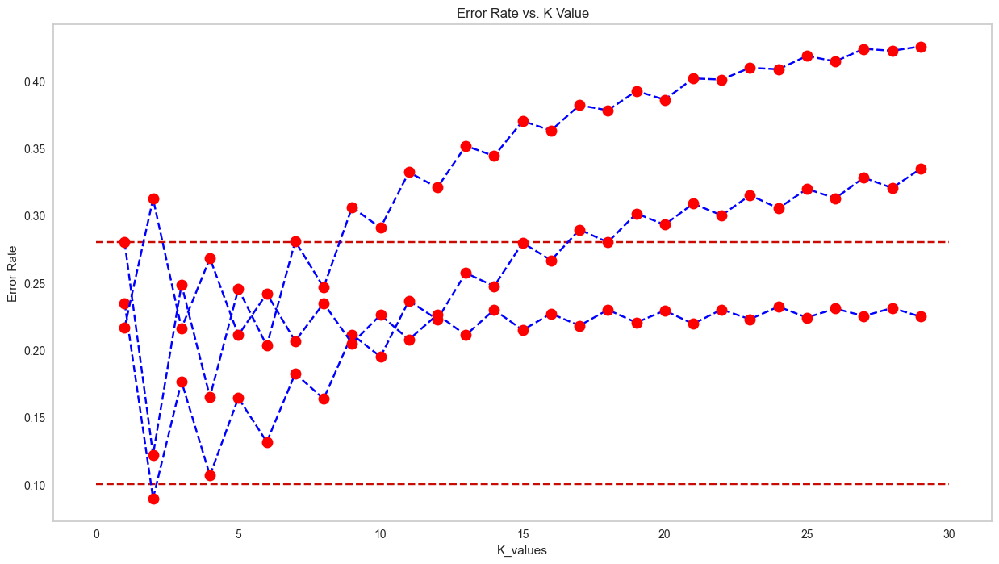

In [40]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.10, xmin = 0, xmax = 30, colors= 'r', linestyles="--")
plt.hlines(y=0.28, xmin = 0, xmax = 30, colors= 'r', linestyles="--")

### Overfitting and underfitting control for k values

In [41]:
test_error_rates = [] # We performed the overfitting and underfitting control processes over the accuracy parameter.
train_error_rates = []


for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_scaled,y_train) 
   
    y_pred_test = knn_model.predict(X_test_scaled)
    y_pred_train = knn_model.predict(X_train_scaled)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    train_error = 1 - accuracy_score(y_train,y_pred_train)
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)

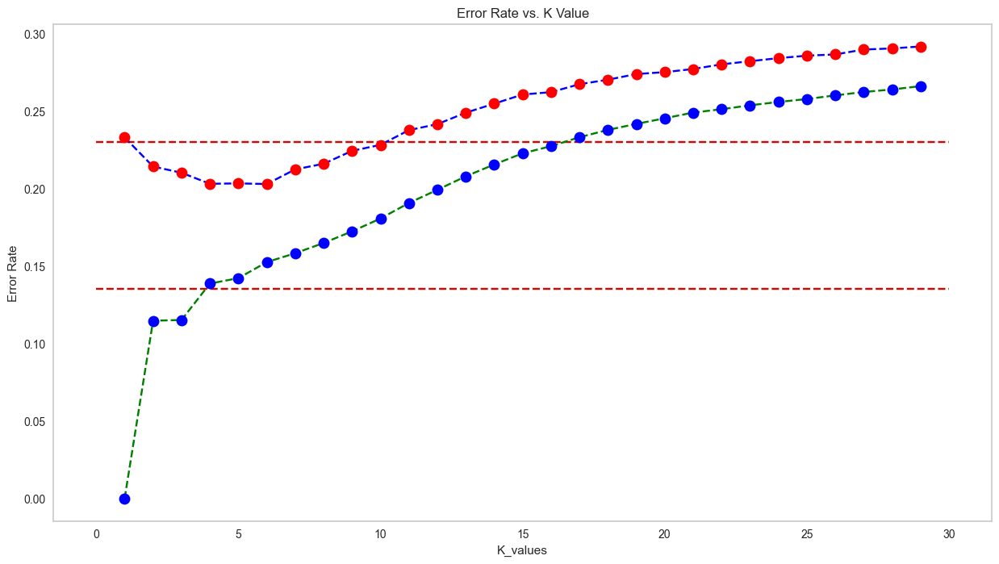

In [42]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.plot(range(1,30), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.23, xmin = 0, xmax = 30, colors= 'r', linestyles="--")
plt.hlines(y=0.135, xmin = 0, xmax = 30, colors= 'r', linestyles="--")

### Scores by Various K Values

WITH K=3

TEST REPORT
              precision    recall  f1-score   support

        Good       0.73      0.75      0.74      3411
        Poor       0.77      0.82      0.80      5745
    Standard       0.82      0.78      0.80     10502

    accuracy                           0.79     19658
   macro avg       0.77      0.79      0.78     19658
weighted avg       0.79      0.79      0.79     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.85      0.87      0.86     13645
        Poor       0.86      0.92      0.89     22978
    Standard       0.91      0.87      0.89     42007

    accuracy                           0.88     78630
   macro avg       0.87      0.89      0.88     78630
weighted avg       0.89      0.88      0.88     78630



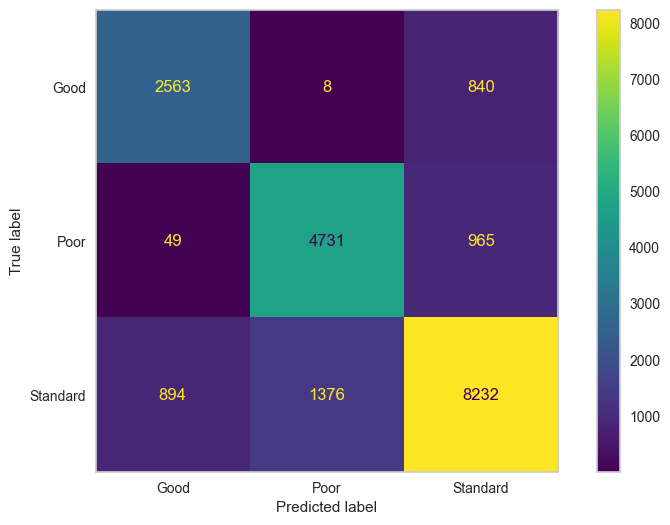

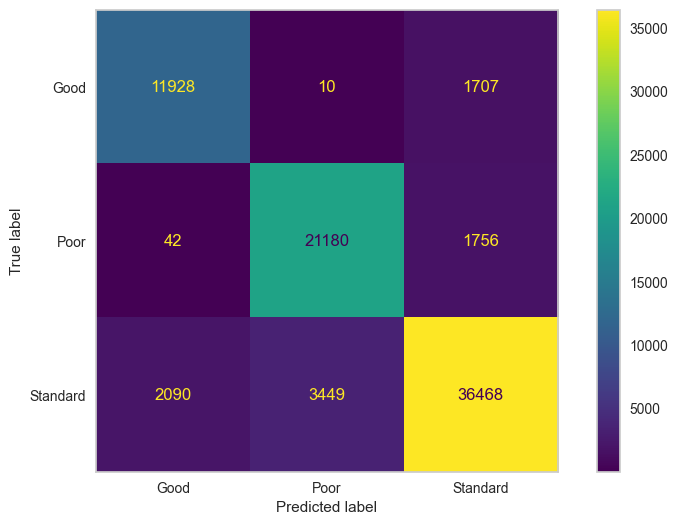

In [45]:
knn = KNeighborsClassifier(n_neighbors=3)  # We did not use the k values below 3 because of the overfitting problem, as can be seen from the graph above.

knn.fit(X_train_scaled,y_train)
print('WITH K=3\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=4

TEST REPORT
              precision    recall  f1-score   support

        Good       0.71      0.83      0.77      3411
        Poor       0.75      0.89      0.82      5745
    Standard       0.87      0.73      0.80     10502

    accuracy                           0.80     19658
   macro avg       0.78      0.82      0.79     19658
weighted avg       0.81      0.80      0.80     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.78      0.92      0.85     13645
        Poor       0.80      0.96      0.87     22978
    Standard       0.94      0.79      0.86     42007

    accuracy                           0.86     78630
   macro avg       0.84      0.89      0.86     78630
weighted avg       0.87      0.86      0.86     78630



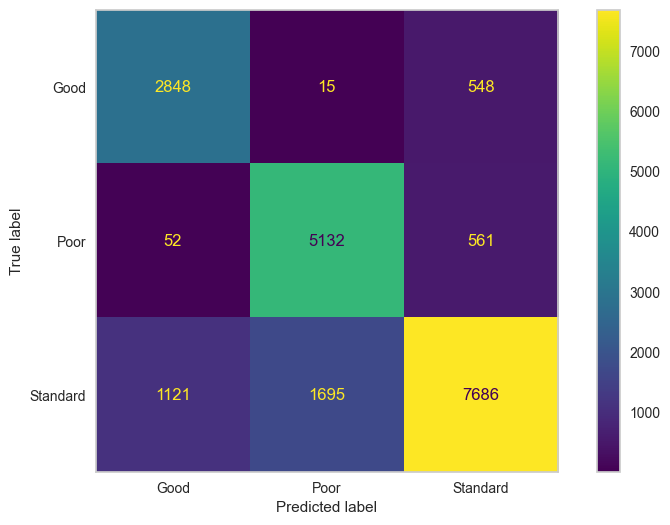

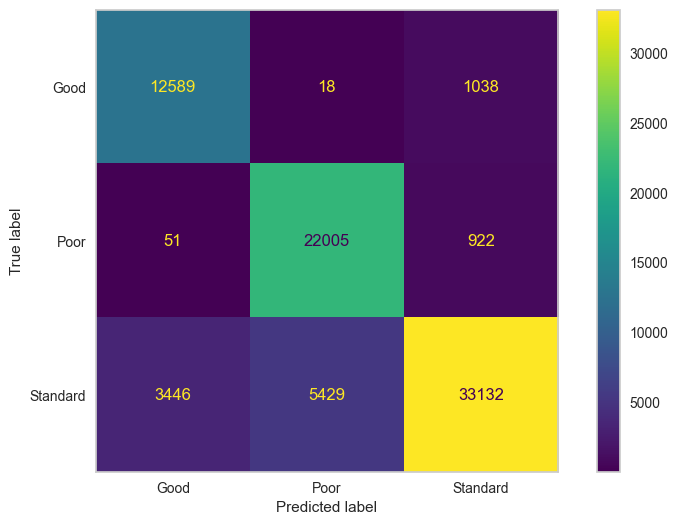

In [46]:
knn = KNeighborsClassifier(n_neighbors=4)  # We can see that we got the best 'poor recall' value when k = 4.

knn.fit(X_train_scaled,y_train)
print('WITH K=4\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=5

TEST REPORT
              precision    recall  f1-score   support

        Good       0.74      0.75      0.75      3411
        Poor       0.78      0.84      0.80      5745
    Standard       0.83      0.79      0.81     10502

    accuracy                           0.80     19658
   macro avg       0.78      0.79      0.79     19658
weighted avg       0.80      0.80      0.80     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.82      0.84      0.83     13645
        Poor       0.83      0.90      0.86     22978
    Standard       0.89      0.84      0.86     42007

    accuracy                           0.86     78630
   macro avg       0.85      0.86      0.85     78630
weighted avg       0.86      0.86      0.86     78630



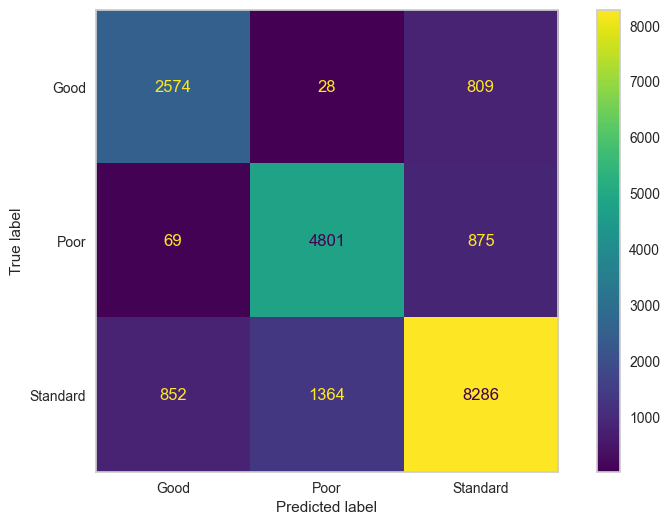

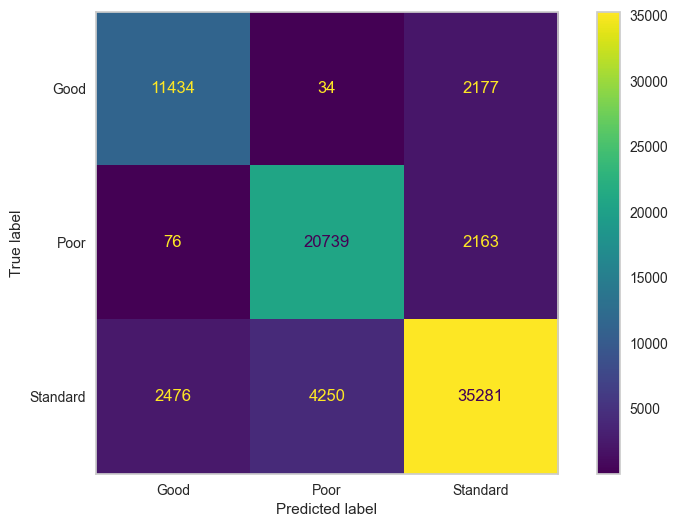

In [47]:
knn = KNeighborsClassifier(n_neighbors=5)  
knn.fit(X_train_scaled,y_train)
print('WITH K=5\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

WITH K=6

TEST REPORT
              precision    recall  f1-score   support

        Good       0.71      0.80      0.75      3411
        Poor       0.76      0.87      0.81      5745
    Standard       0.86      0.76      0.80     10502

    accuracy                           0.80     19658
   macro avg       0.78      0.81      0.79     19658
weighted avg       0.80      0.80      0.80     19658




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

        Good       0.78      0.87      0.82     13645
        Poor       0.80      0.93      0.86     22978
    Standard       0.91      0.80      0.85     42007

    accuracy                           0.85     78630
   macro avg       0.83      0.86      0.84     78630
weighted avg       0.86      0.85      0.85     78630



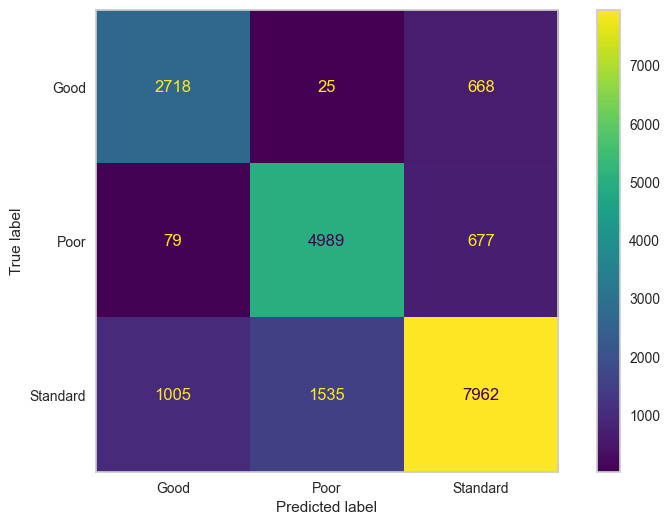

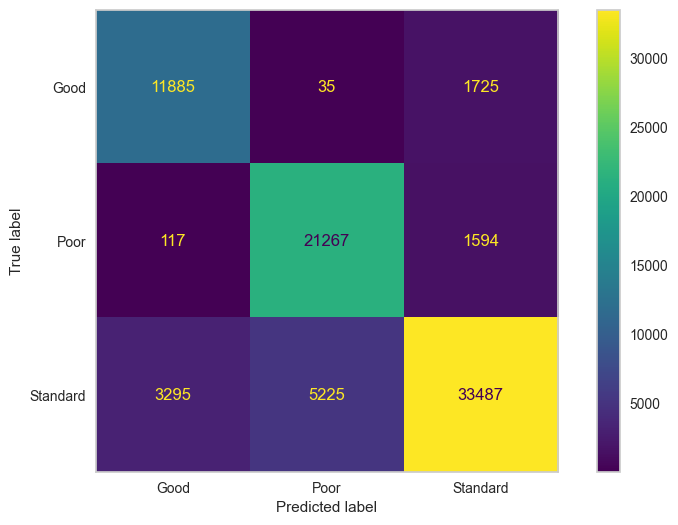

In [48]:
knn = KNeighborsClassifier(n_neighbors=6)  
knn.fit(X_train_scaled,y_train)
print('WITH K=6\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

### Cross Validate For Optimal K Value

In [50]:
from sklearn.model_selection import cross_val_score, cross_validate

In [51]:
scoring = {"f1_Poor" : make_scorer(f1_score, average = None, labels =["Poor"]),
           "precision_Poor" : make_scorer(precision_score, average = None, labels =["Poor"]),
           "recall_Poor" : make_scorer(recall_score, average = None, labels =["Poor"])}

In [53]:
model = KNeighborsClassifier(n_neighbors=4)

scores = cross_validate(model, X_train_scaled, y_train, scoring = scoring , cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_f1_Poor,test_precision_Poor,test_recall_Poor
1,0.06,0.74,0.81,0.74,0.89
2,0.07,0.86,0.81,0.75,0.89
3,0.06,0.72,0.82,0.76,0.89
4,0.06,0.75,0.81,0.74,0.90
5,0.06,0.85,0.81,0.75,0.88
6,0.06,0.70,0.81,0.74,0.89
7,0.06,0.76,0.81,0.75,0.89
8,0.06,0.75,0.81,0.75,0.89
9,0.06,0.76,0.81,0.75,0.89
10,0.06,0.75,0.81,0.74,0.90


##### With the above process, we determined that the recall, precision and f1 values we obtained when k = 4 cover the whole data, not just a part of the data, and are correct.

### KNN Model GridSearch on Pipeline

In [55]:
from sklearn.model_selection import GridSearchCV

In [56]:
param_grid_2 = {"knn__n_neighbors":range(3,8), "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}

In [57]:
pipe_model_2 = Pipeline(steps=operations_2)

In [58]:
recall_Poor =  make_scorer(recall_score, average=None, labels=["Poor"])

In [59]:
pipe_grid = GridSearchCV(pipe_model_2, param_grid_2, cv=5, scoring= recall_Poor)

In [60]:
pipe_grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('OneHotEncoder',
                                        ColumnTransformer(remainder=MinMaxScaler(),
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         Index(['Occupation', 'Payment_of_Min_Amount'], dtype='object'))])),
                                       ('knn',
                                        KNeighborsClassifier(n_neighbors=9))]),
             param_grid={'knn__n_neighbors': range(3, 8), 'knn__p': [1, 2],
                         'knn__weights': ['uniform', 'distance']},
             scoring=make_scorer(recall_score, average=None, labels=['Poor']))

In [61]:
pipe_grid.best_params_

{'knn__n_neighbors': 4, 'knn__p': 1, 'knn__weights': 'uniform'}

### Evaluating Precision-Recall Curves

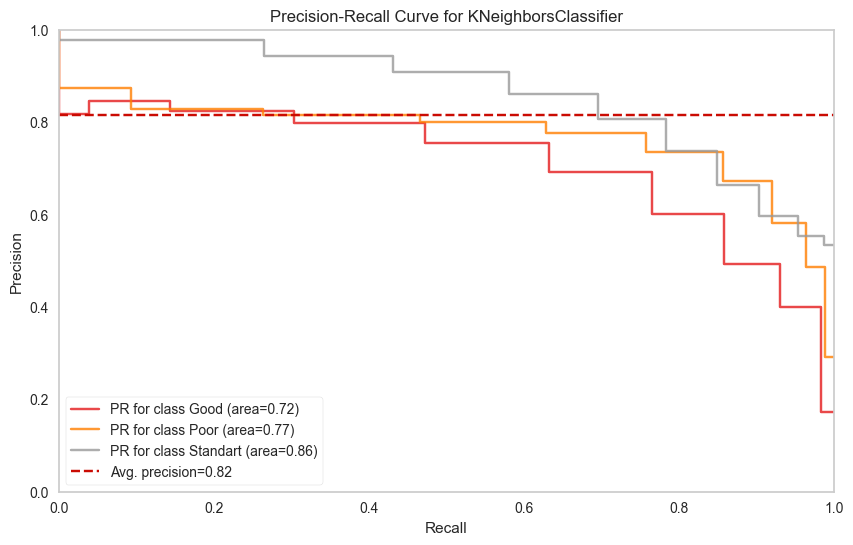

In [54]:
# precision-recall curve for KNN grid model

from yellowbrick.classifier import PrecisionRecallCurve

model = knn_pipe_model

viz = PrecisionRecallCurve(
    model,
    per_class=True,
    classes=["Good", "Poor", "Standart"],
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Bagging DT Model</p>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Random Forest Model</p>

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix

In [ ]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

scoring = {"f1_Poor" : make_scorer(f1_score, average = None, labels =["Poor"]),
           "precision_Poor" : make_scorer(precision_score, average = None, labels =["Poor"]),
           "recall_Poor" : make_scorer(recall_score, average = None, labels =["Poor"])}

In [ ]:
from sklearn.ensemble import RandomForestClassifier

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">Extra Trees Model</p>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Implement ANN Models</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a> 

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:125%; text-align:center; border-radius:10px 10px;">ANN Model</p>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Comparing the Performances of the Models</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Feature Importance</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>

## <p style="background-color:#262222; font-family:arial; color:#d0fc08; font-size:175%; text-align:center; border-radius:10px 10px;">Building Final Model for Model Deployment</p>

<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:#d0fc08; background-color:#262222" data-toggle="popover">Content</a>